<img src="seminarlogo.png" class="center" style="width:100%;"> </img>

# <span style="color:navy"> **Seminar Project:** </span> <span style="color:green"> **Video Coding**</span>

<div style="background-color:#ebeff7; padding:1.25em; border-radius:1em; border: 1px solid black">

### <span style = "color: navy"> **General Procedure:** </span>
1. Make group of $2$ or $3$ students while coordinating with each other and select one group coordinator.
2. Select one the techniques (MDCT or Lapped Transform)
4. Send us the the selected task (technique) and the list of group members with their <b>a)</b> Matriculation Numbers <b>b)</b> email IDs, and highlighting the group coordinator. Make it in a **table** form.
5. The duration of the seminar project is from **11.06.2024** to **31.07.2024**, with a mid-term meeting with each group from *01.07.2024 to 06.07.2024* (Book an appointment at your convenience)
6. There will be a report at the end of project. The submission date for the report is **31.07.2024**
7. The report and results presentation will held from *01.08.2024 to 15.08.2024* (The specific date for each group will be selected after mutual consensus)


<span style="color:blue"> Note: Further Instructions and procedures may be updated from time to time</span>
    
</div>

## <span style = "color: navy"> **Introduction:** </span>
There are two seminar projects, with the aim to compress the given images (Only use the given image in the base repository). The projects are:
<br>
### **Project-1:** <span style = "color: green"> Image-Compression using MDCT </span>
### **Project-2:** <span style = "color: green"> Image-Compression using Lapped Transform </span>

The projects are team-based work with a group of **2** (minimum) to **3** (maximum) students. You (as a team) are required to select one project and implement the technique (either *MDCT* or *Lapped* Transform). <span style = "color: red">To make a balance in project selection, we can assign either Project-1 or Project-2 to any group.</span>

### <span style = "color: navy"> GET STARTED </span>
The basic building blocks (base algorithm and/or material) of the Projects are provided in the git-repository (https://github.com/Karanraj06/image-compression).
In this repository, the implementation of image compression is done by using simple **DCT** which you can take as your staring point and further develop or modify this base-repository according to the selected project i.e. techniques (*MDCT* or *Lapped* Transform) of selected project.

### <span style = "color: navy"> Project Tasks </span>
1. Take the base repository as base or reference
2. Modify the DCT part with your selected technique (either MDCT or Lapped Transform)
    - For the "MDCT" you need to find out the optimum window, try different windows
    - The "lapped transform" needs to be implemented by Pytorch's Conv2D. For that, the kernel size can be chosen like the MDCT, which is 16x16. In order to get good transform filters, it needs to be trained, and for that you need to use the images in the image coder repository.
5. Compare the results of compression of your modified version with the reference, which is DCT, by using Perceptual Similarity Metric and compression ratio. The repository for Perceptual Similarity Metric measurement is given here (https://github.com/richzhang/PerceptualSimilarity)
6. The expected calculations among others should include the results of "bits per pixel"

### <span style = "color: navy"> Some use full links </span>
1. https://github.com/TUIlmenauAMS/Python-Audio-Coder
2. https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html

##### <span style="color:blue"> Further details will be discussed with the group coordinators and the they are responsible for group coordination</span>

<div style="background-color:#ebeff7; padding:1.25em; border-radius:1em; border: 1px solid black">

### <span style="color:navy; font-size: 1.25em"> **Project:** </span>
#### <span style="color:blue"> Below Enter Matriculation Numbers of each member </span>

</div>

MatriculationNumber = '65860'

### <span style="color:navy; font-size: 1.25em"> **Description:**</span>
Place to describe the task, procedure, results etc. (delete this line when writting)

In [ ]:
# Place to write your codes etc.
# YOUR CODE HERE

In [1]:
!git clone https://github.com/richzhang/PerceptualSimilarity.git

Cloning into 'PerceptualSimilarity'...


In [2]:
!git clone https://github.com/Karanraj06/image-compression.git

Cloning into 'image-compression'...


In [3]:
!pip install lpips

  Using cached mkl-2021.4.0-py2.py3-none-win_amd64.whl.metadata (1.4 kB)
  Using cached intel_openmp-2021.4.0-py2.py3-none-win_amd64.whl.metadata (1.2 kB)
   ---------------------------------------- 0.0/53.8 kB ? eta -:--:--
   ---------------------------------------- 53.8/53.8 kB 2.7 MB/s eta 0:00:00
Using cached mkl-2021.4.0-py2.py3-none-win_amd64.whl (228.5 MB)
Using cached intel_openmp-2021.4.0-py2.py3-none-win_amd64.whl (3.5 MB)


In [17]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

# Define a transform to normalize the data
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load CIFAR-10 dataset
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False, num_workers=2)

class LappedTransformCNN(nn.Module):
    def __init__(self):
        super(LappedTransformCNN, self).__init__()
        #in_channels=3, out_channels=64, kernel_size=4, stride=4, padding=0, bias=False
        #12self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=8, stride=8, padding=0, bias=False)
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=8, stride=8, padding=0, bias=False)
        self.conv2 = nn.ConvTranspose2d(in_channels=16, out_channels=3, kernel_size=8, stride=8, padding=0, bias=False)

    def forward(self, x):
        x = self.conv1(x)  
        x = self.conv2(x) 
        return x

model = LappedTransformCNN()

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 5

for epoch in range(num_epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, _ = data 

        optimizer.zero_grad()

        outputs = model(inputs)  
        loss = criterion(outputs, inputs) 
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if i % 100 == 99:  
            print(f"[{epoch + 1}, {i + 1}] loss: {running_loss / 100:.3f}")
            running_loss = 0.0

print('Finished Training')

# Evaluate the model
model.eval()
total_loss = 0.0
with torch.no_grad():
    for data in testloader:
        inputs, _ = data 
        outputs = model(inputs)
        loss = criterion(outputs, inputs)
        total_loss += loss.item()

print(f'Average test loss: {total_loss / len(testloader):.3f}')

# Save the model
torch.save(model.state_dict(), 'lapped_transform_cnn.pth')


Files already downloaded and verified
Files already downloaded and verified
[1, 100] loss: 0.104
[1, 200] loss: 0.040
[1, 300] loss: 0.030
[2, 100] loss: 0.021
[2, 200] loss: 0.019
[2, 300] loss: 0.017
[3, 100] loss: 0.015
[3, 200] loss: 0.015
[3, 300] loss: 0.015
[4, 100] loss: 0.015
[4, 200] loss: 0.015
[4, 300] loss: 0.015
[5, 100] loss: 0.014
[5, 200] loss: 0.015
[5, 300] loss: 0.015
Finished Training
Average test loss: 0.014


In [36]:
model = LappedTransformCNN()
model.load_state_dict(torch.load('lapped_transform_cnn.pth'))
model.eval()

LappedTransformCNN(
  (conv1): Conv2d(3, 16, kernel_size=(8, 8), stride=(8, 8), bias=False)
  (conv2): ConvTranspose2d(16, 3, kernel_size=(8, 8), stride=(8, 8), bias=False)
)

In [38]:
import os
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import lpips

image_paths = []
images = []
byte_streams = []
quantized_images = []
scales = []
min_vals = []


for filename in os.listdir('/content/image-compression/images/colored'):
    if filename.endswith('.png'):
        image_paths.append(os.path.join('/content/image-compression/images/colored', filename))

for path in image_paths:
    image = Image.open(path)
    image = transforms.ToTensor()(image).unsqueeze(0)
    image = (image - 0.5) / 0.5
    images.append(image)

loss_fn = lpips.LPIPS(net='alex').cuda()

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


Number of original images: 24
Number of reconstructed images: 48


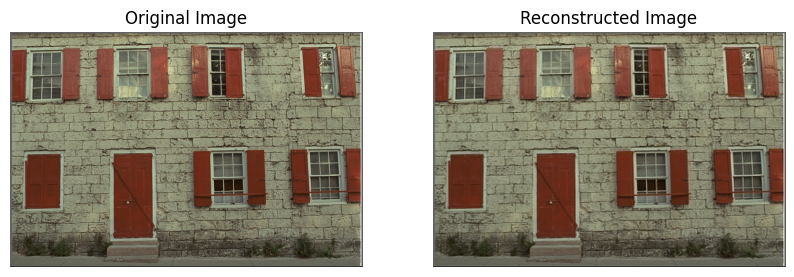

Perceptual similarity (LPIPS): 0.2520127296447754
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


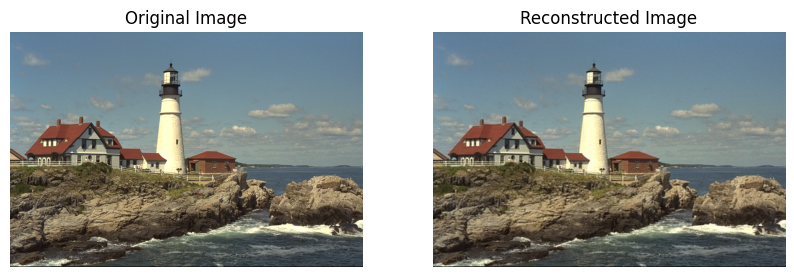

Perceptual similarity (LPIPS): 0.209929957985878
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


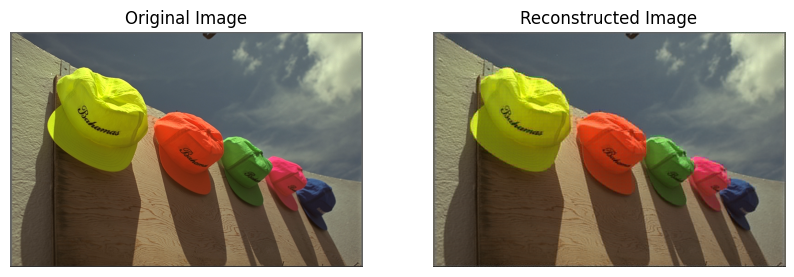

Perceptual similarity (LPIPS): 0.1065014898777008
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


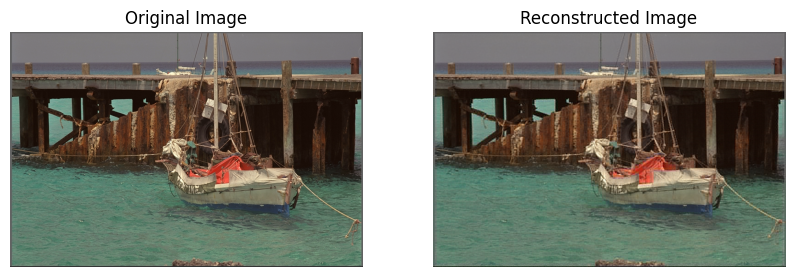

Perceptual similarity (LPIPS): 0.21722149848937988
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


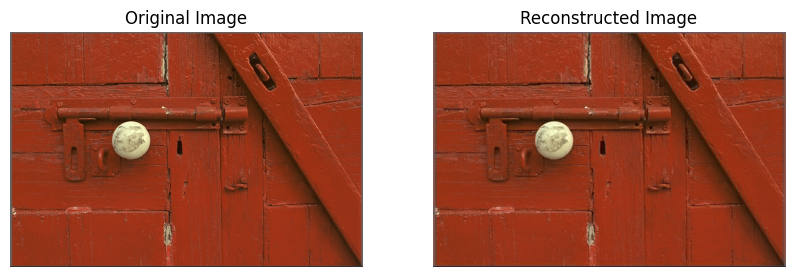

Perceptual similarity (LPIPS): 0.22711488604545593
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


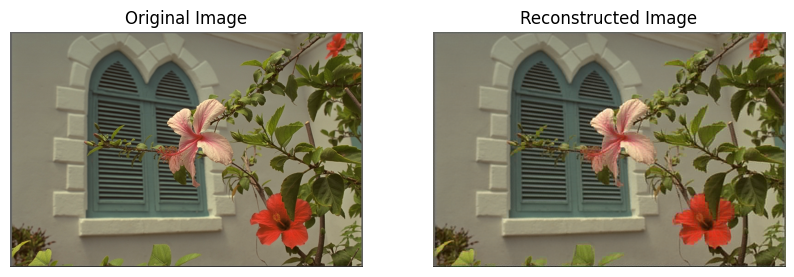

Perceptual similarity (LPIPS): 0.11004862189292908
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


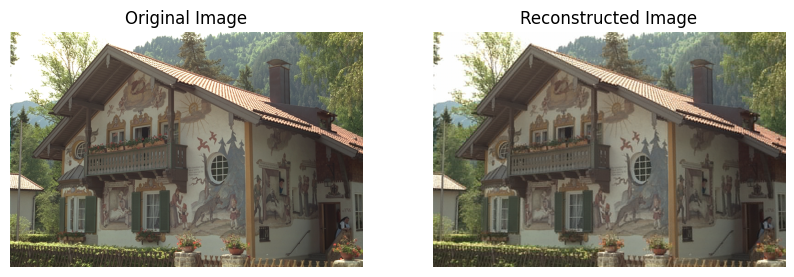

Perceptual similarity (LPIPS): 0.20918378233909607
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


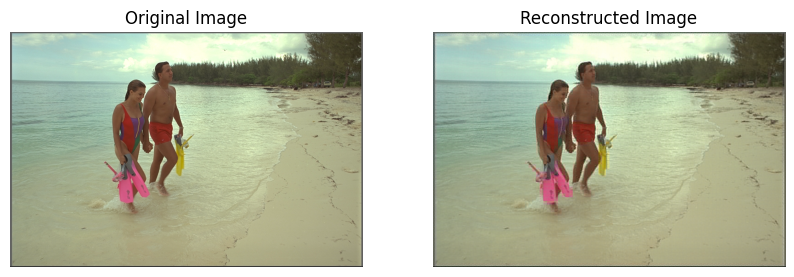

Perceptual similarity (LPIPS): 0.16484060883522034
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


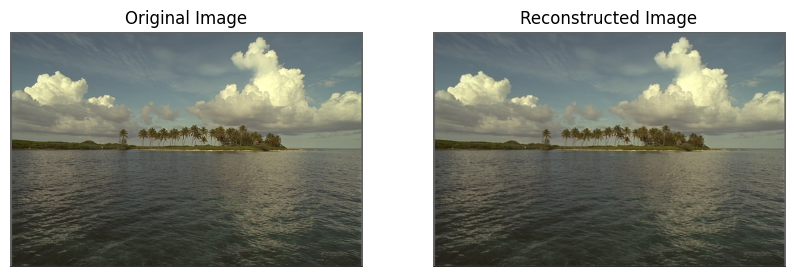

Perceptual similarity (LPIPS): 0.18058204650878906
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


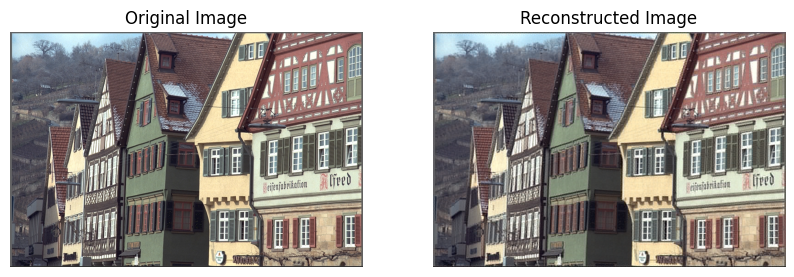

Perceptual similarity (LPIPS): 0.23489773273468018
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


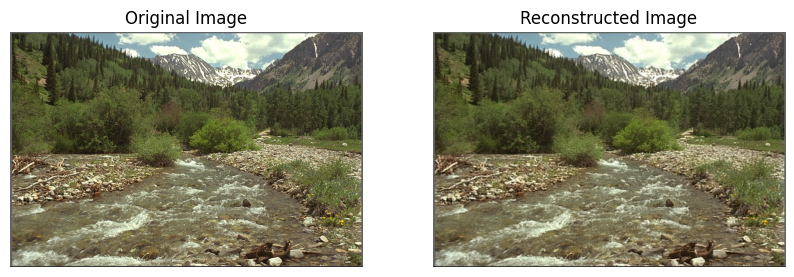

Perceptual similarity (LPIPS): 0.3466072082519531
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


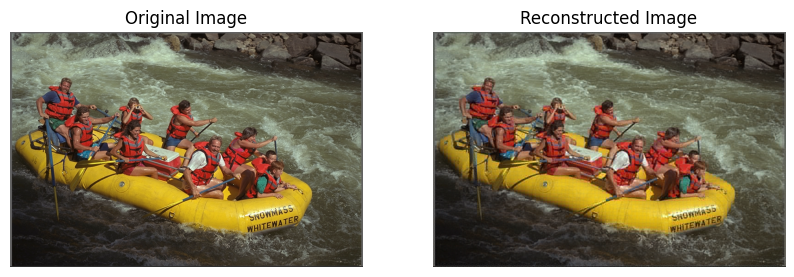

Perceptual similarity (LPIPS): 0.2360529899597168
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


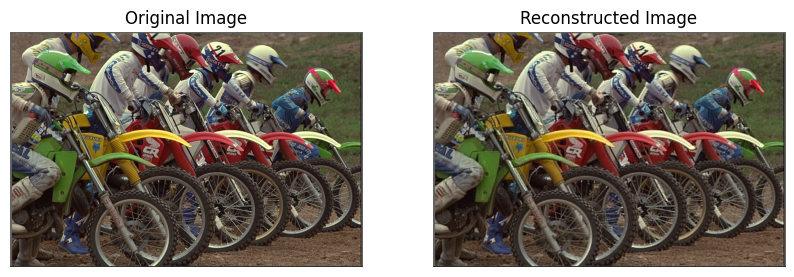

Perceptual similarity (LPIPS): 0.20291294157505035
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


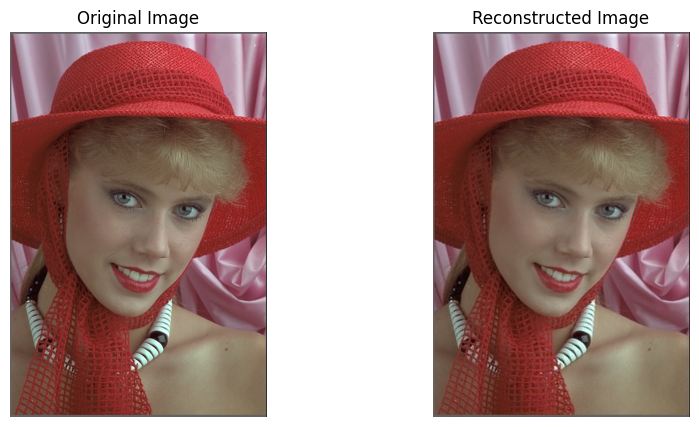

Perceptual similarity (LPIPS): 0.17178264260292053
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


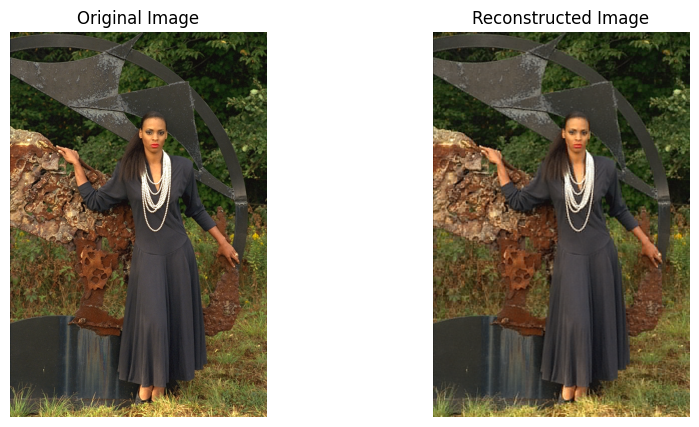

Perceptual similarity (LPIPS): 0.22028714418411255
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


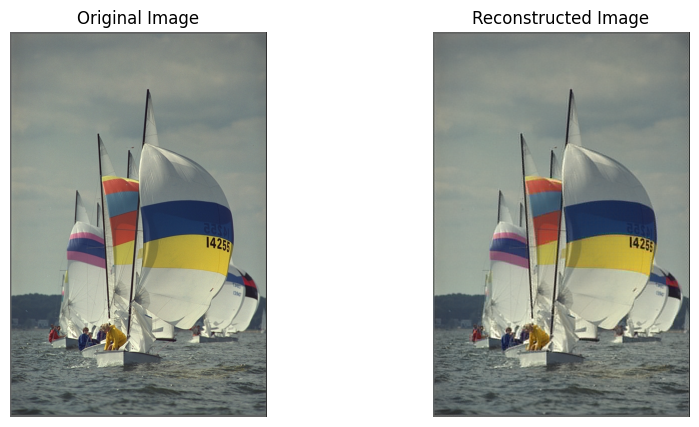

Perceptual similarity (LPIPS): 0.16131708025932312
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


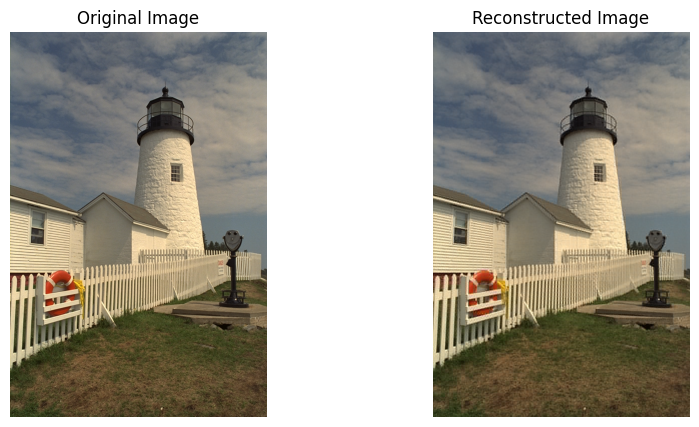

Perceptual similarity (LPIPS): 0.22901546955108643
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


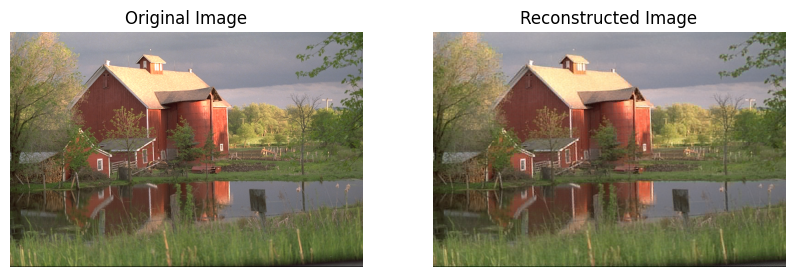

Perceptual similarity (LPIPS): 0.23186510801315308
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


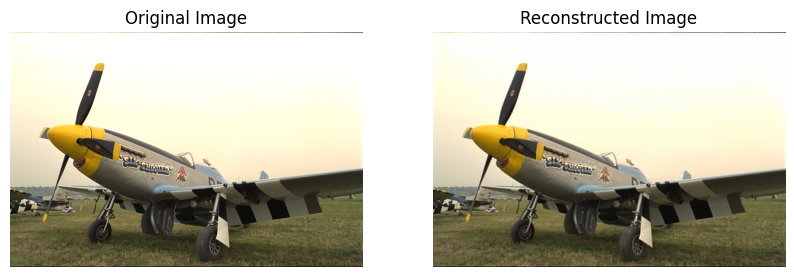

Perceptual similarity (LPIPS): 0.15445207059383392
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


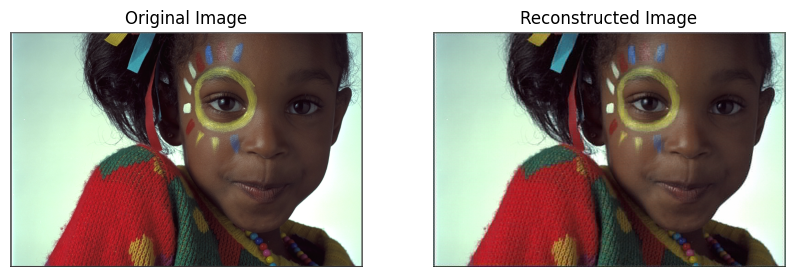

Perceptual similarity (LPIPS): 0.17664013803005219
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


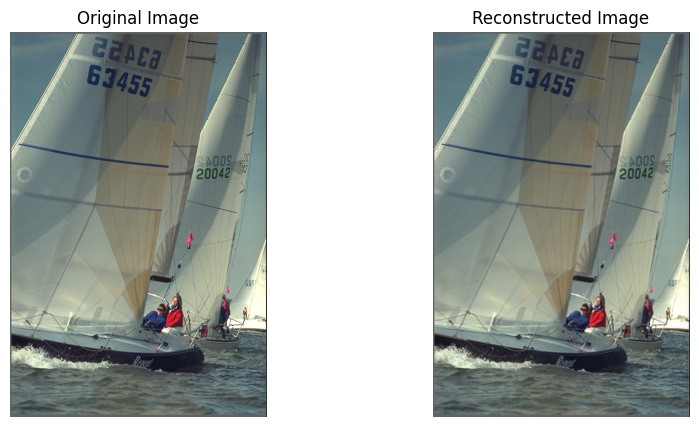

Perceptual similarity (LPIPS): 0.16197022795677185
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


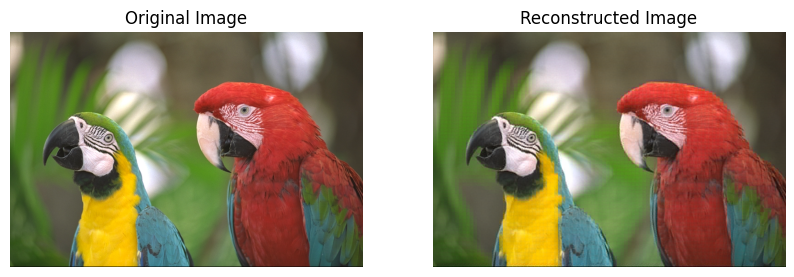

Perceptual similarity (LPIPS): 0.09713533520698547
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


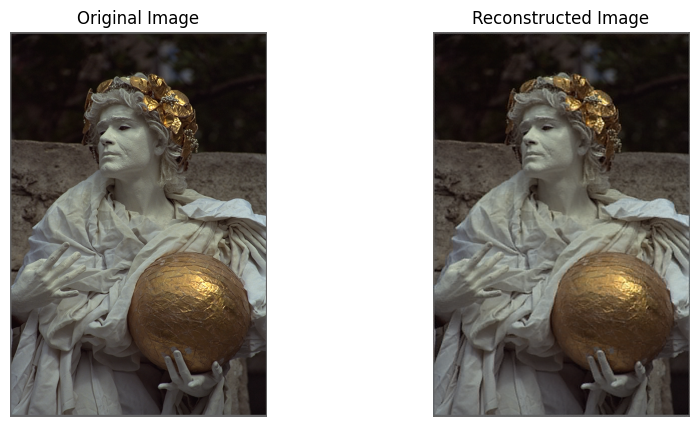

Perceptual similarity (LPIPS): 0.14033706486225128
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


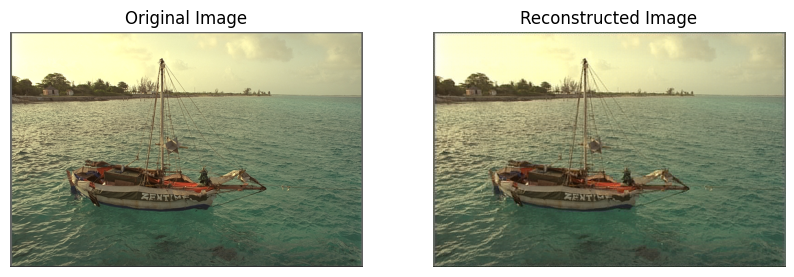

Perceptual similarity (LPIPS): 0.2279578149318695
Original image size: 4718592
Compressed image size: 393216
Compression ratio: 12.0


In [40]:
denormalize = transforms.Normalize((-1.0, -1.0, -1.0), (2.0, 2.0, 2.0))

def denormalize_image(tensor):
    return denormalize(tensor)

def quantize(tensor, num_levels):
    min_val = tensor.min()
    max_val = tensor.max()
    scale = (max_val - min_val) / (num_levels - 1)
    quantized = torch.round((tensor - min_val) / scale)
    return quantized, scale, min_val

def dequantize(quantized, scale, min_val):
    dequantized = quantized * scale + min_val
    return dequantized

def compress_image(images, model, num_levels):
    for image in images:
        with torch.no_grad():
            transformed_image = model.conv1(image)
            quantized_image, scale, min_val = quantize(transformed_image, num_levels)
            flat_quantized = quantized_image.flatten().cpu().numpy()
            byte_stream = flat_quantized.tobytes()

            byte_streams.append(byte_stream)
            quantized_images.append(quantized_image.shape)
            scales.append(scale)
            min_vals.append(min_val)
    return byte_streams, quantized_images, scales, min_vals

def decompress_image(byte_streams, shapes, scales, min_vals, model):
    reconstructed_images = []
    for byte_stream, shape, scale, min_val in zip(byte_streams, shapes, scales, min_vals):
        flat_quantized = np.frombuffer(byte_stream, dtype=np.float32)
        quantized_image = torch.tensor(flat_quantized).view(shape).to(model.conv1.weight.device)
        dequantized_image = dequantize(quantized_image, scale, min_val)
        with torch.no_grad():
            dequantized_image = model.conv2(dequantized_image)
        reconstructed_images.append(dequantized_image)
    return reconstructed_images

compressed_byte_streams, shapes, scales, min_vals = compress_image(images, model, num_levels=256)
reconstructed_images = decompress_image(compressed_byte_streams, shapes, scales, min_vals, model)

print(f"Number of original images: {len(images)}")
print(f"Number of reconstructed images: {len(reconstructed_images)}")

for i in range(len(images)):
    original_image_np = denormalize_image(images[i]).squeeze().permute(1, 2, 0).cpu().numpy()
    reconstructed_image_np = denormalize_image(reconstructed_images[i]).squeeze().permute(1, 2, 0).cpu().numpy()
    original_image_np = np.clip(original_image_np, 0, 1)
    reconstructed_image_np = np.clip(reconstructed_image_np, 0, 1)

    original_image_pil = Image.fromarray((original_image_np * 255).astype(np.uint8))
    reconstructed_image_pil = Image.fromarray((reconstructed_image_np * 255).astype(np.uint8))
    original_image_pil.save(f'original_image_{i}.png')
    reconstructed_image_pil.save(f'reconstructed_image_{i}.png')

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original_image_np)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Reconstructed Image')
    plt.imshow(reconstructed_image_np)
    plt.axis('off')
    plt.show()

    d = loss_fn.forward(images[i].cuda(), reconstructed_images[i].cuda())
    print(f'Perceptual similarity (LPIPS): {d.item()}')

    original_image_size = images[i].nelement() * images[i].element_size()
    compressed_image_size = len(compressed_byte_streams[i])
    compression_ratio = original_image_size / compressed_image_size
    print(f'Original image size: {original_image_size}')
    print(f'Compressed image size: {compressed_image_size}')
    print(f'Compression ratio: {compression_ratio}')


### <span style="color:blue"> END Report here </span>